In [1]:
import numpy as np
import pandas as pd
import re
import os

import skimage.io
import skimage.segmentation
import matplotlib.pyplot as plt
from glob import glob

import cv2

cwd = os.getcwd()
print(cwd)

/opt/zhuoyao_workspace/final_medical_cervix_2/tools


In [2]:
data_dir = os.path.join(cwd, '../src/CLASSIFY/inceptionV3_final_1/datasets')
DATAROOT = os.path.join(data_dir,'classify')
CROP_DIR = 'crops'
PREVIEW_DIR = 'preview'
CLASSES = ['NORM','LSIL_IMG','HSIL','LSIL_HPV','NILM','SCC']

COLUMNS = ['folder','point','FOV_type','type']

In [3]:
def show_statics(df,classes):
    print(df.head())
    folders = df['folder'].unique()
    print("Total images: "+ str(len(folders))+'\n')
    print("Total cells :" + str(len(df)))
    for i in range(len(classes)):
        print("Number of {} cells:{}".format(classes[i],np.sum(df['type']==i)))
        if i ==0:
            print('===================')
    print("========================")
    for i in range(1,len(classes)):
        count = np.sum((df['FOV_type']==i)&(df['type']==0))
        print("Number of {} Norm cells:{}".format(classes[i],count))
    print('========================')
    tmp_df = df[['folder','FOV_type']].groupby(['FOV_type','folder']).count().reset_index()
    for i in range(1,len(classes)):
        print("Number of {} FOVs:{}".format(classes[i],np.sum(tmp_df['FOV_type']==i)))
    print('\n')

def get_rest_segs(folder,fov_type, picked_segs):
    seg_path = os.path.join(DATAROOT,folder,CROP_DIR)
    files = os.listdir(seg_path)
    rest_segs = [ int(file.split('.')[0]) for file in files if int(file.split('.')[0]) not in picked_segs]
    #print(rest_segs[:5])
    rest_segs_df = pd.DataFrame(columns=COLUMNS)
    rest_segs_df['point'] = rest_segs
    rest_segs_df['folder'] = folder
    rest_segs_df['FOV_type'] = fov_type
    rest_segs_df['path'] = rest_segs_df[['folder','point']].apply(lambda x: os.path.join(DATAROOT,
                                                                x['folder'],
                                                                CROP_DIR,
                                                                str(x['point'])+'.png'),
                                            axis=1) 
    rest_segs_df['type'] = 0
    
    #print(folder)
    #print(picked_segs)
    #print(len(set(picked_segs)))
    assert len(files)==(len(rest_segs_df)+len(picked_segs)),\
    "Count of files: {}, Count of df:{},Count of picked_segs:{}".format(len(files),len(rest_segs_df),len(picked_segs))
    return rest_segs_df

## Cells Distribute Analysis

In [4]:
fd = open('./listfile6.txt','r')
content = eval(fd.read())

select_df = pd.DataFrame(columns=COLUMNS)

for folder,pos,neg in content:
    #add norm cell
    df_temp = pd.DataFrame([range(len(COLUMNS))],columns=COLUMNS)
    df_temp['folder'] = folder
    for i,clazz in enumerate(CLASSES[1:]):
        if re.match(clazz,folder):
            cell_type = i+1
            break
    df_temp['FOV_type']=cell_type
    
    for cell in set(neg):
        tmp = df_temp.copy()
        tmp[['point','type']]=[cell,0]
        select_df = select_df.append(tmp,ignore_index=True)
    
    #add ab norm cell
    for cell in set(pos):
        tmp = df_temp.copy()
        tmp[['point','type']]=[cell,cell_type]
        select_df = select_df.append(tmp,ignore_index=True)

#Gen crop file path
select_df['path'] = select_df[['folder','point']].apply(lambda x: os.path.join(DATAROOT,
                                                                x['folder'],
                                                                CROP_DIR,
                                                                str(x['point'])+'.png'),
                                            axis=1) 

In [5]:
## ALL cells dataframes Gen
folders = select_df['folder'].unique()
cells_df = select_df.copy()

for folder in folders:
    picked_segs = select_df.loc[select_df['folder']==folder]['point'].values
    #print(df.loc[df['folder']==folder]['FOV_type'])
    fov_type = select_df.loc[select_df['folder']==folder]['FOV_type'].values[0]
    #don't use the HSIL and SCC, for most cells are abnormal
    if fov_type in [2,5]:
        continue
    rest_seg_df = get_rest_segs(folder,fov_type, picked_segs)
    #print(rest_seg_df)
    cells_df = cells_df.append(rest_seg_df,ignore_index=True)

In [6]:
print(len(cells_df))

17273


In [7]:
#Read crop box coordinate
box_df = pd.DataFrame(columns=['folder','point','x1','y1','w1','h1'])

for folder in folders:
    coordinate_file_path = os.path.join(DATAROOT, folder, PREVIEW_DIR, 'index_file.txt')
    tmp_df = pd.read_csv(coordinate_file_path,names=['point','x1','y1','w1','h1'],sep=' ')
    tmp_df['folder'] = folder
    box_df = box_df.append(tmp_df,ignore_index=True)

cells_df = pd.merge(cells_df,box_df,on=['folder','point'])
select_df = pd.merge(select_df,box_df,on=['folder','point'])


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:6211: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort)


**Selected cells statics**

In [8]:
from plotly.offline import download_plotlyjs

In [9]:
import plotly.offline as py
import plotly.graph_objs as go
from plotly import tools

py.init_notebook_mode(connected=True)

In [10]:
CLASSES

['NORM', 'LSIL_IMG', 'HSIL', 'LSIL_HPV', 'NILM', 'SCC']

In [11]:
tmp

,folder,point,FOV_type,type
0,SCC_IMG036x008.png_output,109,5,5


In [12]:
ab_class = ['LSIL_IMG', 'HSIL', 'LSIL_HPV', 'SCC']
norm_class = ['LSIL_IMG', 'HSIL','LSIL_HPV', 'NILM', 'SCC']
tmp = select_df[['point','type','FOV_type']].groupby(['type','FOV_type']).count().reset_index()

#print(tmp.loc[tmp['type']!=0]['point'].values)

trace1 = go.Bar(
    x=ab_class,
    y=tmp.loc[tmp['type']!=0]['point'].values,
    name='Abnormal'
)

trace2 = go.Bar(
    x=norm_class,
    y=tmp.loc[tmp['type']==0]['point'].values,
    name='Normal'
)

data = [trace1,trace2]

layout = go.Layout(
    barmode='stack'
)

fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

#fig = plt.subplot()
#plt.bar(classes,tmp.point)

for i in range(len(classes)):
    print("Number of {} cells:{}".format(classes[i],np.sum(select_df['type']==i)))
print("========================")
for i in range(1,len(classes)):
    print("Number of {} total cells:{}".format(classes[i],np.sum(select_df['FOV_type']==i)))
print('========================')

**All cells statics**

In [20]:
tmp = cells_df[['point','type','FOV_type']].groupby(['type','FOV_type']).count().reset_index()
ab_class = ['LSIL_IMG', 'HSIL', 'LSIL_HPV', 'SCC']
norm_class = ['LSIL_IMG', 'HSIL','LSIL_HPV', 'NILM', 'SCC']
trace1 = go.Bar(
    x=ab_class,
    y=tmp.loc[tmp['type']!=0]['point'].values,
    name='Abnormal'
)

trace2 = go.Bar(
    x=norm_class,
    y=tmp.loc[tmp['type']==0]['point'].values,
    name='Normal'
)

data = [trace1,trace2]

layout = go.Layout(
    barmode='stack'
)

fig = go.Figure(data=data, layout=layout)
py.iplot(fig)


**Attention**

这张图片只是显示当前的Norm与Abnorm细胞的分布，因为Cell的选择不完全，所以仅作参考

#do the splits for FOVs
tmp_df = df[['folder','FOV_type']].groupby(['FOV_type','folder']).count().reset_index()
X = tmp_df['folder'].values
y = tmp_df['FOV_type'].values

skf = StratifiedKFold(n_splits=6,random_state=1)
skf.get_n_splits(X,y)

for train_index, test_index in (skf.split(X,y)):
    #for SCC only have 1 FOV, we want to put it into train set.
    #so here we select the only split with SCC in train set
    if 'SCC_IMG001x001.png_output' in X[train_index]:
        train_set = df.loc[df['folder'].apply(lambda x: x in X[train_index])]
        test_set = df.loc[df['folder'].apply(lambda x: x in X[test_index])]
        break



## Pre Segment Analysis

In [13]:
org_dir = os.path.join(data_dir,'origin_10_1_abnormal_img')
#test_dir = os.path.join(data_dir,'origin_test')

In [14]:
filelist = os.listdir(org_dir)
#print(filelist)
#train_orig = np.random.choice(filelist)
train_orig = 'LSIL_HPV_IMG001x004.png'
print(train_orig)
image_org = cv2.imread(os.path.join(org_dir,train_orig))
image_org = cv2.cvtColor(image_org,cv2.COLOR_BGR2RGB)

#mask image
mask_dir = os.path.join(data_dir,'classify',train_orig+'_output','preview/mask.png')
mask = cv2.imread(mask_dir,cv2.IMREAD_GRAYSCALE)
print(mask.shape)
print(np.unique(mask))

#marked image
marked_dir = os.path.join(data_dir,'classify',train_orig+'_output','preview/preview.png')
image_marked = cv2.imread(marked_dir)
image_marked = cv2.cvtColor(image_marked,cv2.COLOR_BGR2RGB)

LSIL_HPV_IMG001x004.png
(1216, 1936)
[  0 255]


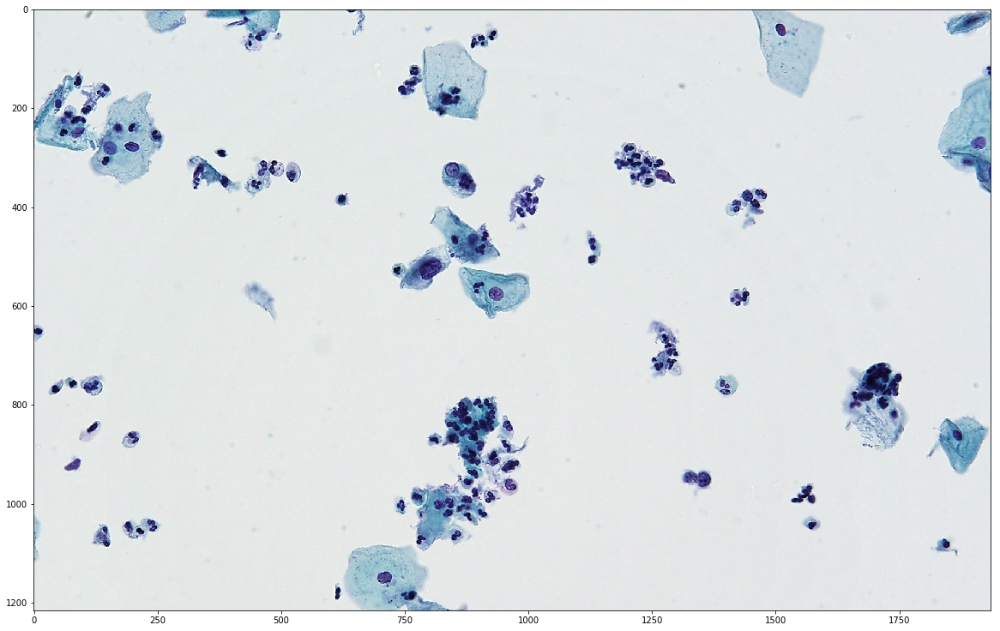

In [15]:
plt.figure(figsize=(20,20))
plt.imshow(image_org)

In [16]:
print(np.unique(mask))
print(mask.shape)
np.count_nonzero(mask)/(mask.shape[0]*mask.shape[1])


[  0 255]
(1216, 1936)


0.02029712306981296

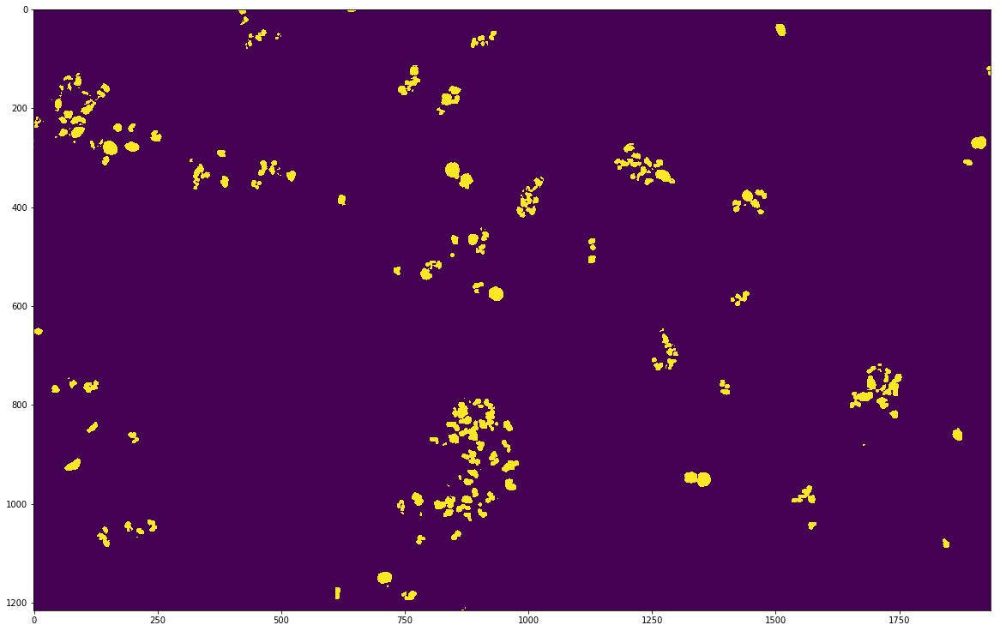

In [17]:
plt.figure(figsize=(20,20))
plt.imshow(mask)

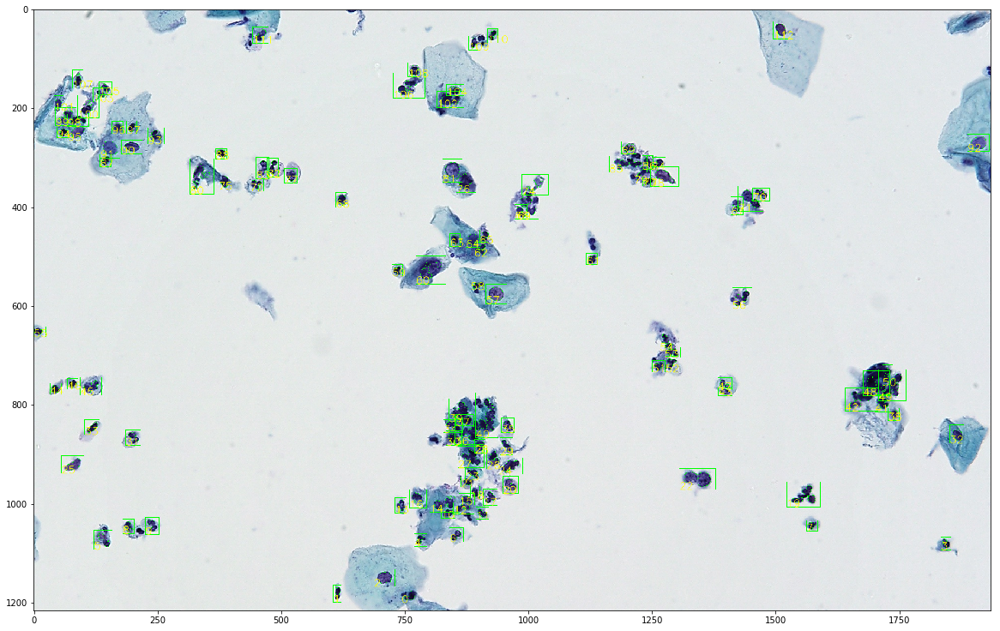

In [18]:
plt.figure(figsize=(20,20))
plt.imshow(image_marked)

## Post Segment Analysis

In [19]:
def get_features(imag_path):
    #cv2 read, return in BGR order
    img = cv2.imread(imag_path)
    #shape
    height = img.shape[0]
    width = img.shape[1]
    ratio = width/height
    area = height*width
    #color
    max_b = np.max(img[:,:,0])
    min_b = np.min(img[:,:,0])
    max_g = np.max(img[:,:,1])
    min_g = np.min(img[:,:,1])
    max_r = np.max(img[:,:,2])
    min_r = np.min(img[:,:,2])
    
    mean_b = np.mean(img[:,:,0])
    mean_g = np.mean(img[:,:,1])
    mean_r = np.mean(img[:,:,2])
    
    #del img
    #gc.collect()
    
    
    return (height,width,ratio,area,max_b,min_b,max_g,min_g,max_r,min_r,mean_b,mean_g,mean_r)

def get_core_ratio(series):
    x1 = series['x1']
    y1 = series['y1']
    h1 = series['h1']
    w1 = series['w1']
    area = h1*w1
    core_area = np.count_nonzero(mask_img[y1:y1+h1, x1:x1+w1])
    
    return core_area/area

In [20]:
features = ['h','w','ratio','area','max_blue','min_blue',\
            'max_green','min_green','max_red','min_red',\
            'mean_blue','mean_green','mean_red']

temp = list(zip(*cells_df['path'].map(get_features)))
for i,f in enumerate(features):
    cells_df[f] = temp[i]

In [21]:
for folder in folders:
    mask_path = os.path.join(DATAROOT, folder, PREVIEW_DIR, 'mask.png')
    mask_img = cv2.imread(mask_path,cv2.IMREAD_GRAYSCALE)
    #print(mask_img.shape)
    
    cells_df.loc[cells_df['folder'] == folder,
                 'core_ratio'] = cells_df.loc[cells_df['folder'] == folder].apply(get_core_ratio,axis=1)
    
features = features + ['core_ratio']
    
    

In [22]:
cells_df.head()

,folder,point,FOV_type,type,path,h1,w1,x1,y1,h,...,max_blue,min_blue,max_green,min_green,max_red,min_red,mean_blue,mean_green,mean_red,core_ratio
0,HSIL_IMG001x002.png_output,128,2,2,/opt/zhuoyao_workspace/final_medical_cervix_2/...,51,43,1615,481,51,...,255,19,249,0,255,0,166.641131,123.499772,104.566803,0.403557
1,HSIL_IMG001x002.png_output,160,2,2,/opt/zhuoyao_workspace/final_medical_cervix_2/...,46,46,1508,351,46,...,255,73,252,17,255,8,174.374764,133.008034,114.997164,0.385161
2,HSIL_IMG001x002.png_output,131,2,2,/opt/zhuoyao_workspace/final_medical_cervix_2/...,36,33,1476,472,36,...,240,88,222,22,225,16,149.120370,88.935185,70.789562,0.447811
3,HSIL_IMG001x002.png_output,135,2,2,/opt/zhuoyao_workspace/final_medical_cervix_2/...,44,37,1581,464,44,...,218,91,188,32,131,17,152.719287,104.813882,56.085995,0.413391
4,HSIL_IMG001x002.png_output,140,2,2,/opt/zhuoyao_workspace/final_medical_cervix_2/...,44,40,1493,450,44,...,214,87,172,18,113,11,143.956818,83.369886,56.859659,0.483523


In [23]:
cells_df['type'] = cells_df['type'].apply(lambda x: int(x>0))

In [24]:
def plot_gen_data(norm_data, abnorm_data):
    trace1 = go.Histogram(
        x=norm_data,
        opacity=0.75,
        name='Norm_cell'
    )

    trace2 = go.Histogram(
        x=abnorm_data,
        opacity=0.75,
        name='Abnorm_cell'
    )
    
    return [trace1,trace2]

def visual_statics(df,features,title):
    fig = tools.make_subplots(rows=(len(features)//2+1),cols=2,subplot_titles=features)

    for i,f in enumerate(features):
        norm = df.loc[df['type']==0][f]
        abnorm = df.loc[df['type']==1][f]
        trace_norm,trace_abnorm = plot_gen_data(norm,abnorm)
    
        fig.append_trace(trace_norm,i//2+1,i%2+1) 
        fig.append_trace(trace_abnorm,i//2+1,i%2+1) 
    
    fig['layout'].update(height=1500,width=1000,title=title,barmode='overlay')
    py.iplot(fig)

In [25]:
cells_df.describe()

,type,h,w,ratio,area,max_blue,min_blue,max_green,min_green,max_red,min_red,mean_blue,mean_green,mean_red,core_ratio
count,6823.000000,6823.000000,6823.000000,6823.000000,6823.000000,6823.000000,6823.000000,6823.000000,6823.000000,6823.000000,6823.000000,6823.000000,6823.000000,6823.000000,6823.000000
mean,0.055547,32.887000,33.553862,1.065499,1177.872490,243.694269,52.953833,226.585666,10.363476,214.397919,8.571743,161.547801,120.189899,105.241714,0.376972
std,0.229062,11.194647,11.490146,0.332794,874.975053,24.029678,26.819337,35.804847,14.744002,45.276049,13.671667,25.617543,30.313903,33.661026,0.057742
min,0.000000,12.000000,12.000000,0.228070,320.000000,40.000000,0.000000,16.000000,0.000000,24.000000,0.000000,23.978961,7.815253,11.797502,0.000000
25%,0.000000,26.000000,26.000000,0.857143,690.000000,242.000000,33.000000,214.000000,0.000000,191.000000,0.000000,149.986881,103.481418,82.093223,0.343750
50%,0.000000,30.000000,30.000000,1.000000,924.000000,255.000000,50.000000,239.000000,5.000000,233.000000,2.000000,166.407273,125.381429,109.371237,0.381803
75%,0.000000,37.000000,37.000000,1.218750,1344.000000,255.000000,70.000000,253.000000,16.000000,248.000000,13.000000,178.841077,141.828806,130.312987,0.410742
max,1.000000,133.000000,137.000000,7.750000,13034.000000,255.000000,173.000000,255.000000,142.000000,255.000000,155.000000,225.546154,203.143077,230.733766,0.803846


In [26]:
visual_statics(cells_df,features,'All cells')

This is the format of your plot grid:
[ (1,1) x1,y1 ]    [ (1,2) x2,y2 ]  
[ (2,1) x3,y3 ]    [ (2,2) x4,y4 ]  
[ (3,1) x5,y5 ]    [ (3,2) x6,y6 ]  
[ (4,1) x7,y7 ]    [ (4,2) x8,y8 ]  
[ (5,1) x9,y9 ]    [ (5,2) x10,y10 ]
[ (6,1) x11,y11 ]  [ (6,2) x12,y12 ]
[ (7,1) x13,y13 ]  [ (7,2) x14,y14 ]
[ (8,1) x15,y15 ]  [ (8,2) x16,y16 ]



**LSIL in ('LSIL','HSIL','LSIL_HPV','NILM','SCC')**

In [27]:
lsil_df = cells_df.loc[cells_df['FOV_type']==1]
lsil_df.describe()

,type,h,w,ratio,area,max_blue,min_blue,max_green,min_green,max_red,min_red,mean_blue,mean_green,mean_red,core_ratio
count,1226.000000,1226.000000,1226.000000,1226.000000,1226.000000,1226.000000,1226.000000,1226.000000,1226.000000,1226.000000,1226.000000,1226.000000,1226.000000,1226.000000,1226.000000
mean,0.039152,34.482871,35.133768,1.070122,1292.228385,240.558728,66.931485,218.222675,18.557096,206.608483,16.123980,162.977510,118.364369,104.842727,0.367933
std,0.194035,12.191270,12.218957,0.340122,948.057740,26.087487,28.418078,40.384258,20.551945,50.406252,17.912466,26.451022,32.510562,35.579418,0.071099
min,0.000000,12.000000,13.000000,0.228070,364.000000,85.000000,0.000000,42.000000,0.000000,51.000000,0.000000,55.891304,24.495726,23.110632,0.000000
25%,0.000000,26.000000,28.000000,0.857143,741.000000,235.000000,46.000000,200.000000,3.000000,172.250000,2.000000,148.333239,98.931830,78.096821,0.333866
50%,0.000000,32.000000,33.000000,1.000000,1036.000000,255.000000,65.000000,232.000000,14.000000,228.000000,13.000000,165.989197,120.338380,104.514046,0.381810
75%,0.000000,39.000000,40.000000,1.218750,1472.000000,255.000000,86.000000,249.000000,25.000000,249.000000,22.000000,181.880439,141.261551,130.420575,0.408722
max,1.000000,117.000000,127.000000,2.916667,9579.000000,255.000000,173.000000,255.000000,142.000000,255.000000,147.000000,225.546154,203.143077,207.335404,0.743056


In [28]:
visual_statics(lsil_df,features,'LSIL')

This is the format of your plot grid:
[ (1,1) x1,y1 ]    [ (1,2) x2,y2 ]  
[ (2,1) x3,y3 ]    [ (2,2) x4,y4 ]  
[ (3,1) x5,y5 ]    [ (3,2) x6,y6 ]  
[ (4,1) x7,y7 ]    [ (4,2) x8,y8 ]  
[ (5,1) x9,y9 ]    [ (5,2) x10,y10 ]
[ (6,1) x11,y11 ]  [ (6,2) x12,y12 ]
[ (7,1) x13,y13 ]  [ (7,2) x14,y14 ]
[ (8,1) x15,y15 ]  [ (8,2) x16,y16 ]



**HSIL in ('LSIL','HSIL','LSIL_HPV','NILM','SCC')**

In [29]:
cells_df['FOV_type'].unique()

array([2, 3, 1, 4, 5], dtype=object)

In [30]:
hsil_df = cells_df.loc[cells_df['FOV_type']==2]
hsil_df.describe()

,type,h,w,ratio,area,max_blue,min_blue,max_green,min_green,max_red,min_red,mean_blue,mean_green,mean_red,core_ratio
count,222.0,222.000000,222.000000,222.000000,222.000000,222.000000,222.000000,222.000000,222.000000,222.000000,222.000000,222.000000,222.000000,222.000000,222.000000
mean,1.0,44.630631,44.495495,1.034184,2082.882883,244.846847,54.666667,229.900901,8.545045,212.612613,4.018018,147.515279,102.137572,77.445075,0.393319
std,0.0,13.236401,12.235157,0.266044,1162.046780,23.527859,19.040007,35.788963,8.662879,52.497649,4.968647,24.508580,28.044623,29.026897,0.051452
min,1.0,21.000000,22.000000,0.573529,506.000000,122.000000,2.000000,79.000000,0.000000,33.000000,0.000000,68.941576,28.794837,17.501832,0.228290
25%,1.0,36.000000,36.000000,0.849697,1365.000000,250.250000,43.000000,222.000000,0.000000,197.500000,0.000000,129.308409,81.287633,55.042718,0.366549
50%,1.0,43.000000,43.000000,1.000000,1844.000000,255.000000,54.000000,247.000000,8.000000,235.500000,2.000000,152.646357,104.199370,74.780520,0.398148
75%,1.0,50.750000,49.000000,1.150000,2439.500000,255.000000,69.000000,254.000000,13.000000,248.000000,7.750000,166.514010,122.862890,98.366557,0.424709
max,1.0,103.000000,86.000000,2.166667,7912.000000,255.000000,115.000000,255.000000,66.000000,255.000000,27.000000,192.209722,162.997917,146.810582,0.561905


In [31]:
visual_statics(hsil_df,features,'HSIL')

This is the format of your plot grid:
[ (1,1) x1,y1 ]    [ (1,2) x2,y2 ]  
[ (2,1) x3,y3 ]    [ (2,2) x4,y4 ]  
[ (3,1) x5,y5 ]    [ (3,2) x6,y6 ]  
[ (4,1) x7,y7 ]    [ (4,2) x8,y8 ]  
[ (5,1) x9,y9 ]    [ (5,2) x10,y10 ]
[ (6,1) x11,y11 ]  [ (6,2) x12,y12 ]
[ (7,1) x13,y13 ]  [ (7,2) x14,y14 ]
[ (8,1) x15,y15 ]  [ (8,2) x16,y16 ]



**Correlation**

In [32]:
correlation_matrix = cells_df[features+['type']].corr()

In [33]:
print(type(correlation_matrix))

<class 'pandas.core.frame.DataFrame'>


In [34]:
trace=go.Heatmap(z=correlation_matrix.values,
                x=features+['type'],
                y=features+['type'])

data=[trace]
py.iplot(data)

## CNN feature extraction

In [35]:
import keras

from keras.models import Model
#from keras.optimizers import Adam
from keras.applications.inception_v3 import InceptionV3
from keras.layers import Dense, Input, Flatten, Dropout, GlobalAveragePooling2D
from keras.layers.normalization import BatchNormalization

Using TensorFlow backend.


In [36]:
def inceptionv3(img_dim):
    input_tensor = Input(shape=img_dim)
    base_model = InceptionV3(include_top=False,
                   weights='imagenet',
                   input_shape=img_dim)
    bn = BatchNormalization()(input_tensor)
    x = base_model(bn)
    x = GlobalAveragePooling2D()(x)
    x = Dropout(0.5)(x)
    output = Dense(1, activation='sigmoid')(x)
    model = Model(input_tensor, output)
    return model

x = InceptionV3(include_top=False,
                   weights='imagenet',
                   input_shape=(299,299,3))
x.summary()

In [37]:
#filepath = 'src/CLASSIFY/inceptionV3_final_1/inception.fold_1.hdf5'
#file = os.path.join(cwd,'../',filepath)
img_size = (299,299)



#print(os.path.exists(file))
a = inceptionv3((299,299,3))
#a.load_weights(filepath = file )

intermediate_layer_model = Model(inputs=a.get_layer('input_1').input,
                                outputs=a.get_layer('global_average_pooling2d_1').input)

In [38]:
intermediate_layer_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 299, 299, 3)       0         
_________________________________________________________________
batch_normalization_95 (Batc (None, 299, 299, 3)       12        
_________________________________________________________________
inception_v3 (Model)         (None, 8, 8, 2048)        21802784  
Total params: 21,802,796
Trainable params: 21,768,358
Non-trainable params: 34,438
_________________________________________________________________


In [39]:
test_files = cells_df['path'].values
#img_size = (299,299)
batch_size = 5


def padding(img,img_size,color):
    shape = img.shape[:-1]
    #print(img.shape,img_size)
    delta_height = img_size[0]-shape[0]
    delta_width = img_size[1]-shape[1]
    top = delta_height//2
    bottom = delta_height-top
    left = delta_width//2
    right = delta_width-left
    new_img = cv2.copyMakeBorder(img,top,bottom,left,right,cv2.BORDER_CONSTANT,value=color)
    return new_img
        #test generator   
def test_generator():
    while True:
        for start in range(0, len(test_files), batch_size):
            x_batch = []
            end = min(start + batch_size, len(test_files))
            test_batch = test_files[start:end]
            for filepath in test_batch:
                img = cv2.imread(filepath)
                #img = cv2.resize(img, img_size)
                img = padding(img,img_size,(0,0,0))
                x_batch.append(img)
            x_batch = np.array(x_batch, np.float32) / 255.
            yield x_batch
                
test_steps = np.ceil(len(test_files) / batch_size)
        
preds_test = intermediate_layer_model.predict_generator(generator=test_generator(),
                                        steps=test_steps, verbose=1)
        


1365/1365 [==============================] - 57s 42ms/step


In [42]:
from sklearn import decomposition
#from sklearn.manifold import TSNE
from MulticoreTSNE import MulticoreTSNE as TSNE

def random_color(seed):
    np.random.seed(seed)
    color = np.random.randint(255,size=3)
    return 'rgb'+str(tuple(color))

In [43]:
def data_visual_2D(data, label):
    graph_data = []
    trace2 = go.Scatter(
            x = data[label[:,1]==0,0],
            y = data[label[:,1]==0,1],
            name = 'Norm',
            mode = 'markers',
            marker = dict(
                size = 5,
                color = 'rgba(255,182,193,.9)'
            ),
            opacity=0.8
    )
    graph_data.append(trace2) 

    for i,name in enumerate(CLASSES[1:]):
        trace1 = go.Scatter(
            x = data[(label==[i+1,1]).all(axis=1),0],
            y = data[(label==[i+1,1]).all(axis=1),1],
            name = name,
            mode = 'markers',
            marker = dict(
                size = 5,
                color = random_color(i*5)
            )
        )
        graph_data.append(trace1)
    py.iplot(graph_data)
    
def data_visual_3D(data, label):
    graph_data = []

    for i,name in enumerate(CLASSES[1:]):
        trace1 = go.Scatter3d(
            x = data[(label==[i+1,1]).all(axis=1),0],
            y = data[(label==[i+1,1]).all(axis=1),1],
            z = data[(label==[i+1,1]).all(axis=1),2],
            name = name,
            mode = 'markers',
            marker = dict(
                size = 2,
                symbol='circle',
                color = random_color(i*5)
            )
        )
        graph_data.append(trace1)

    trace2 = go.Scatter3d(
            x = data[label[:,1]==0,0],
            y = data[label[:,1]==0,1],
            z = data[label[:,1]==0,2],
            name = 'Norm',
            mode = 'markers',
            marker = dict(
                size = 2,
                symbol='circle',
                color = 'rgba(255,182,193,.9)'
            ),
            opacity=0.5
    )
    graph_data.append(trace2) 

    layout = go.Layout(
        margin=dict(
            l=0,
            r=0,
            b=0,
            t=0
        )
    )
    fig = go.Figure(data=graph_data,layout=layout)

    py.iplot(fig)

In [44]:
label = cells_df[['FOV_type','type']].values
#print(np.unique(label[:,1]))
#print(label.shape)
#(label == [2,1]).all(axis=1).sum()

In [45]:
re_preds = np.reshape(preds_test,(preds_test.shape[0],-1))
pca = decomposition.PCA(n_components=2)
pca.fit(re_preds)

X_pca = pca.transform(re_preds)

In [46]:
data_visual_2D(X_pca,label)

In [47]:
re_preds = np.reshape(preds_test,(preds_test.shape[0],-1))
pca = decomposition.PCA(n_components=3)
pca.fit(re_preds)

X_pca = pca.transform(re_preds)

In [48]:
data_visual_3D(X_pca,label)

## t-SNE

In [49]:
X_tsne = TSNE(n_components=2,perplexity=70,n_jobs=16).fit_transform(re_preds)

KeyboardInterrupt: 

In [ ]:
data_visual_2D(X_tsne,label)

In [ ]:
X_tsne = TSNE(n_components=3,perplexity=50,n_jobs=16).fit_transform(re_preds)

In [ ]:
data_visual_3D(X_tsne,label)

## Brightness Normalization

In [90]:
img_path = '../datasets/origin_test/2018-12-14/HYN_HSIL_IMG010x010.png'
img2_path = '../datasets/origin_test/2018-12-14/FJ_IMG011x027.png'

In [125]:
import operator
from functools import reduce
from PIL import Image


def equalize(img):

    hist,bins = np.histogram(img.flatten(),256,[0,256])

    cdf = hist.cumsum()
    cdf_normalized = cdf * hist.max()/ cdf.max()

    plt.plot(cdf_normalized, color = 'b')
    plt.hist(img.flatten(),256,[0,256], color = 'r')
    plt.xlim([0,256])
    plt.legend(('cdf','histogram'), loc = 'upper left')
    plt.show()
    cdf_m = np.ma.masked_equal(cdf,0)
    cdf_m = (cdf_m - cdf_m.min())*255/(cdf_m.max()-cdf_m.min())
    cdf = np.ma.filled(cdf_m,0).astype('uint8')
    img = cdf[img]
    return img

In [133]:
im = cv2.imread(img_path, 1)

#lut = equalize(im)

#lut = lut[:,:,::-1]

In [127]:
np.shape(lut)

(1216, 1936, 3)

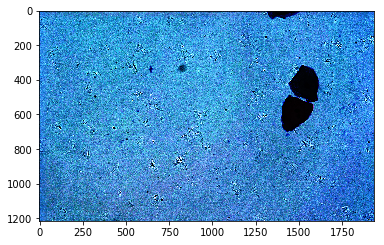

In [128]:
plt.imshow(lut)

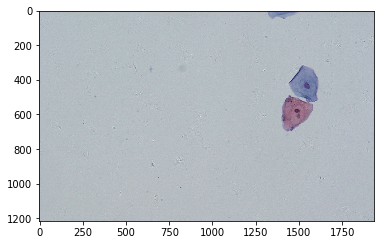

In [63]:
plt.imshow(im)

In [129]:
clahe = cv2.createCLAHE(clipLimit=2.0,tileGridSize=(8,8))

In [134]:
cl1 = clahe.apply(im)

error: OpenCV(3.4.3) /io/opencv/modules/imgproc/src/clahe.cpp:351: error: (-215:Assertion failed) _src.type() == CV_8UC1 || _src.type() == CV_16UC1 in function 'apply'
